In [1]:
using FileIO: load, save, loadstreaming, savestreaming
import LibSndFile
using SampledSignals
using Plots
gr()

Plots.GRBackend()

In [2]:
# Load local .wav file
audio_data = load("../Resources/OneShotSnare.wav")

12000-frame, 2-channel SampleBuf{FixedPointNumbers.Fixed{Int16,15}, 2}
0.25s sampled at 48000.0Hz
▇▇▆▇▇▇▇▇▇▇▆▆▆▆▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▄▄▄▄▄▄▄▄▄▄▃▃▃▃▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
▇▇▆▇▇▇▇▇▇▇▆▆▆▆▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▄▄▄▄▄▄▄▄▄▄▃▃▃▃▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁

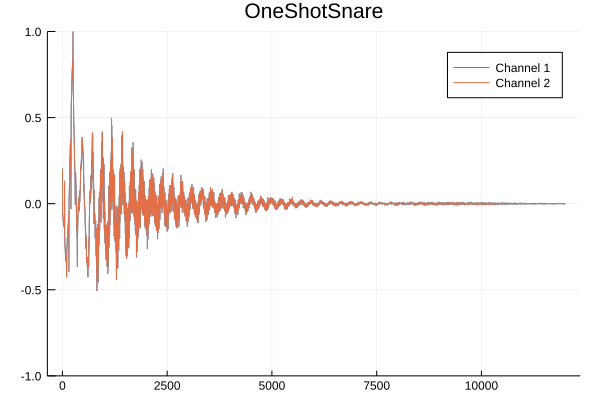

In [3]:
# extract audio data as 2dArray
wave_data = convert(Array{Float64}, audio_data.data)
p = plot(ylims=(-1, 1), title="OneShotSnare")
plot!(p, wave_data[:, 1], label="Channel 1")
plot!(p, wave_data[:, 2], label="Channel 2")

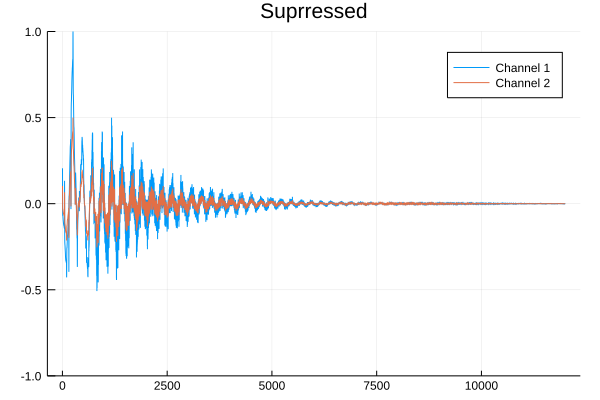

In [4]:
# suprress gain at channel 2
gain_suprressed = [wave_data[:, 1] wave_data[:, 2]*0.5]
p = plot(ylims=(-1, 1), title="Suprressed")
plot!(p, gain_suprressed[:, 1], label="Channel 1")
plot!(p, gain_suprressed[:, 2], label="Channel 2")

In [5]:
# Play gain_suprressed data
new_audio = SampleBuf(gain_suprressed, audio_data.samplerate)

12000-frame, 2-channel SampleBuf{Float64, 2}
0.25s sampled at 48000.0Hz
▇▇▆▇▇▇▇▇▇▇▆▆▆▆▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▄▄▄▄▄▄▄▄▄▄▃▃▃▃▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
▆▇▆▆▆▆▆▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▄▄▄▄▄▄▄▄▄▄▃▃▃▄▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁

In [6]:
# save audio
save("../Resources/OneShotSnareSuppressGain.wav", new_audio)

In [7]:
# load audio
load("../Resources/OneShotSnareSuppressGain.wav")

12000-frame, 2-channel SampleBuf{Float64, 2}
0.25s sampled at 48000.0Hz
▇▇▆▇▇▇▇▇▇▇▆▆▆▆▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▄▄▄▄▄▄▄▄▄▄▃▃▃▃▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
▆▇▆▆▆▆▆▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▄▄▄▄▄▄▄▄▄▄▃▃▃▄▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁